In [1]:
%load_ext watermark
%watermark
import copy
import pickle
import os

import pandas as pd
from pandas.tseries.offsets import Week
import pandas_datareader.data as web
import numpy as np
import sklearn.mixture as mix
from sklearn.externals import joblib
import scipy.stats as scs
from math import ceil

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.dates import YearLocator, MonthLocator
%matplotlib inline

import seaborn as sns
import missingno as msno
from tqdm import tqdm

import warnings
warnings.filterwarnings("ignore")
import affirm 

sns.set(font_scale=1.25)
style_kwds = {'xtick.major.size': 3, 'ytick.major.size': 3,
              'font.family':u'CamingoCode', 'legend.frameon': True}
sns.set_style('white', style_kwds)

p=print
p()
%watermark -p pandas,pandas_datareader,numpy,scipy,sklearn,matplotlib,seaborn

2017-04-20T14:38:34-06:00

CPython 3.6.0
IPython 5.1.0

compiler   : GCC 4.4.7 20120313 (Red Hat 4.4.7-1)
system     : Linux
release    : 4.4.0-72-generic
machine    : x86_64
processor  : x86_64
CPU cores  : 8
interpreter: 64bit

pandas 0.19.2
pandas_datareader 0.3.0.post
numpy 1.12.1
scipy 0.19.0
sklearn 0.18.1
matplotlib 2.0.0
seaborn 0.7.1


In [82]:
def get_etf_data(mkt, start, end):
    """Function to get benchmark data from 
        Yahoo and Factor data from FRED
    
    Params:
        mkt : str(), symbol
        start : pd.DateTime()
        end : pd.DateTime()
        factors : list() of str()
    Returns:
        data : pd.DataFrame()
    """
    MKT = (web.DataReader([mkt], 'yahoo', start, end)['Adj Close']
           .rename(columns={mkt:mkt})
           .assign(lret=lambda x: np.log(x[mkt]/x[mkt].shift(1)))
           .rename(columns={'lret':mkt+'_lret'}))
    return MKT 

def get_fred_data(factors, start, end):
    """Fn to get factor data from FRED
    
    Params:
        factors : list() of str()    
        start : pd.DateTime()
        end : pd.DateTime()
    Returns:
        data : pd.DataFrame()
    """

    data = (web.DataReader(factors, 'fred', start, end))
    return data      

class ModelRunner():
    def __init__(self, data, **kwds):
        """Class to run mixture model model
        
        Params:
            data : pd.DataFrame()
            ft_cols : list() of feature columns str()
            k : int(), n_components
            max_iter : int(), max iterations
            init : str() {random, kmeans}
        """
        self.data = data
        self.ft_cols = kwds['ft_cols']
        self.k = kwds['k']
        self.max_iter = kwds['max_iter']
        self.init = kwds['init']
        
        #np.random.seed(123457)  # make results reproducible
        
    def _run_model(self, data, bgm=None, **kwargs):
        """Function to run mixture model

        Params:
            data : pd.DataFrame() 
            ft_cols : list of str() 
            k : int(), n_components
            max_iter : int()
            init : str(), (random, kmeans)

        Returns:
            model : sklearn model object
            hidden_states : array-like, hidden states
        """
        X = data[self.ft_cols].values

        if bgm:
            model = mix.BayesianGaussianMixture(n_components=self.k, 
                                                max_iter=self.max_iter, 
                                                init_params=self.init,
                                                random_state=0,
                                                **kwargs,
                                               ).fit(X)
        else:
            model = mix.GaussianMixture(n_components=self.k, 
                                        max_iter=self.max_iter, 
                                        init_params=self.init,
                                        random_state=0,
                                        **kwargs,
                                       ).fit(X)

        hidden_states = model.predict(X)
        return model, hidden_states    
    
    def _get_state_est(self, model, hidden_states):
        """Function to return estimated state mean and state variance

        Params:
            model : sklearn model object
            hidden_states : {array-like}
        Returns:
            mr_i : mean return of last estimated state
            mvar_i : model variance of last estimated state
        """
        # get last state
        last_state = hidden_states[-1]
        # first value is mean return for ith state
        # ft_cols in order ['ETF_lret', 'TEDRATE', 'T10Y2Y', 'T10Y3M']
        mr_i = model.means_[last_state][0] 
        mvar_i = np.diag(model.covariances_[last_state])[0]         
        return mr_i, mvar_i   
    
    def _get_ci(self, mr_i, mvar_i, alpha, a, b, nSamples):
        """Function to sample confidence intervals 
            from the JohnsonSU distribution

        Params:
            mr_i : float()
            mvar_i : float()
            alpha : float()
            a : float()
            b : float() 
            nsamples : int()
            bins : int() 
        Returns:
            ci : tuple(float(), float()), (low_ci, high_ci) 
        """
        np.random.seed(123457)
        rvs_ = scs.johnsonsu.rvs(a, b, loc=mr_i, scale=mvar_i, size=nSamples)
        ci = scs.johnsonsu.interval(alpha=alpha, a=a, b=b,
                                    loc=np.mean(rvs_), scale=np.std(rvs_))
        
        #rvs_ = scs.norm.rvs(loc=mr_i, scale=mvar_i, size=nSamples)
        #ci = scs.norm.interval(alpha=alpha, 
        #                       loc=np.mean(rvs_), scale=np.std(rvs_))
        return ci
     
    def prediction_cycle(self, *args, **kwargs):  
        """Function to make walk forward predictions from cutoff year onwards
        
        Params:
            year : int(), cutoff year
            alpha : float()
            a : float()
            b : float() 
            nsamples : int()
        Returns:
            dict() :
                pred : pd.DataFrame()
                year : str()
                a, b : float(), float()
        """
        cutoff = year
        # index code takes advantage of pandas .ix datetime convention
        # when selecting by year only, pandas defaults to first day of year
        # when selecting an end point by year only, pandas defaults to 
        #  last day of year 
        train_df = self.data.ix[str(cutoff - lookback):str(cutoff)].dropna()
        # train_df stops one step before start of out of sample (oos) dataframe        
        oos = self.data.ix[str(cutoff+1):].dropna()
        # confirm that end index train_df is different than oos start index
        assert train_df.index[-1] != oos.index[0]

        # create pred list to hold tuple rows
        pred_list = []
        # 't' iterates through the oos index
        # this ensures our predictions are made using only info 
        # available to us one step prior to actual return
        for t in tqdm(oos.index):
            # insample begins one step before oos df
            # at start insample equals train_df
            if t == oos.index[0]:
                insample = train_df

            # run model func to return model object and hidden states using params
            model, hstates = self._run_model(insample, **kwargs)
            # get hidden state mean and variance
            mr_i, mvar_i = self._get_state_est(model, hstates)
            # get confidence intervals from sampled distribution
            low_ci, high_ci = self._get_ci(mr_i, mvar_i, alpha, a, b, nSamples)
            # append tuple row to pred list
            pred_list.append((t, hstates[-1], mr_i, mvar_i, low_ci, high_ci))
            # increment insample dataframe 
            # insample increment includes the day 't'
            #   should it include up to t! is it subtle lookahead!
            #   not sure! i think it may be fine as is
            # trim dataframe 
            insample = self.data.ix[t - lookback*52*Week():t] # 
            # note the cycle increments after we set the new insample

        cols = ['Dates', 'ith_state', 'ith_ret', 'ith_var', 'low_ci', 'high_ci']
        pred_df = (pd.DataFrame(pred_list, columns=cols)
                .set_index('Dates').assign(tgt = oos[mkt + '_lret']))

        # logic to see if error exceeds neg or pos CI
        pred_copy = pred_df.copy().reset_index()
        # Identify indices where target return falls between CI
        win = pred_copy.query("low_ci < tgt < high_ci").index
        # create list of binary variables representing in/out CI
        in_rng_list = [1 if i in win else 0 for i in pred_copy.index]
        # assign binary variables sequence to new column
        pred_df['in_rng'] = in_rng_list
        return {'pred':pred_df, 'year':year, 'a':a, 'b':b}    
    

In [41]:
from pandas.tseries.offsets import BDay

In [56]:
#df1 = data.copy()
#df1.ix['2008':'2009'].head()
start = 2007
end = 2008

cutoff = 2007
# index code takes advantage of pandas .ix datetime convention
# when selecting by year only, pandas defaults to first day of year
# when selecting an end point by year only, pandas defaults to 
#  last day of year 
train_df1 = df1.ix[str(cutoff - lookback):str(cutoff)].dropna()
# train_df stops one step before start of out of sample (oos) dataframe        
oos1 = df1.ix[str(cutoff+1):].dropna()
# confirm that train_df end index is different than oos start index
assert train_df1.index[-1] != oos1.index[0]

p(train_df1.head())
p()
p(train_df1.tail())
p()
p(oos1.head())

                   SPY  SPY_lret        QQQ  QQQ_lret        TLT  TLT_lret  \
2006-02-07   99.621164 -0.008886  36.900035 -0.004420  61.420910 -0.004735   
2006-02-08  100.526233  0.009044  37.326885  0.011501  61.278545 -0.002321   
2006-02-09  100.359511 -0.001660  36.972689 -0.009534  61.556500  0.004526   
2006-02-10  100.542109  0.001818  37.199738  0.006122  61.217533 -0.005522   
2006-02-13  100.359511 -0.001818  36.772888 -0.011541  61.224309  0.000111   

                  GLD  GLD_lret        EFA  EFA_lret        EEM  EEM_lret  \
2006-02-07  54.599998 -0.038093  44.830666 -0.007436  26.134654 -0.026586   
2006-02-08  54.830002  0.004204  44.990696  0.003563  26.215900  0.003104   
2006-02-09  56.180000  0.024323  45.077988  0.001938  26.283602  0.002579   
2006-02-10  54.790001 -0.025053  44.976150 -0.002262  26.242979 -0.001547   
2006-02-13  53.720001 -0.019722  44.663361 -0.006979  25.595705 -0.024974   

                  DBC  DBC_lret  TEDRATE  T10Y2Y  T10Y3M  
2006-02-0

In [78]:
# create pred list to hold tuple rows
pred_list = []
# 't' iterates through the oos index
# this ensures our predictions are made using only info 
# available to us one step prior to actual return
i = 0
for t in tqdm(oos1.index):
    p('*'*79)
    p('i: {} t: {}'.format(i, t))
    if i == 3:
        break
    # insample begins one step before oos df
    # at start insample equals train_df
    if t == oos1.index[0]:
        insample1 = train_df1
        p('begin t:', t)
        p('begin insample index:', insample1.index[0])
        p('ending insample index:', insample1.index[-1])
        p()
        #p('ending insample index df tail:\n', insample1.tail())
        p()
    p('-'*79)
    p('i: ',i)        
    p('before insample index update:', insample1.index[0])
    p('ending insample index update:', insample1.index[-1])
        
    insample1 = df1.ix[t - 52*Week():t] # (t - lookback*252*BDay())
    
    p('insample update index begin:', insample1.index[0])
    p('insample update index end:', insample1.index[-1])
    p()
    #p('insample update df tail:\n', insample1.tail())
    i += 1

  0%|          | 0/2207 [00:00<?, ?it/s]

*******************************************************************************
i: 0 t: 2008-01-02 00:00:00
begin t: 2008-01-02 00:00:00
begin insample index: 2006-02-07 00:00:00
ending insample index: 2007-12-31 00:00:00


-------------------------------------------------------------------------------
i:  0
before insample index update: 2006-02-07 00:00:00
ending insample index update: 2007-12-31 00:00:00
insample update index begin: 2007-01-03 00:00:00
insample update index end: 2008-01-02 00:00:00

*******************************************************************************
i: 1 t: 2008-01-03 00:00:00
-------------------------------------------------------------------------------
i:  1
before insample index update: 2007-01-03 00:00:00
ending insample index update: 2008-01-02 00:00:00
insample update index begin: 2007-01-04 00:00:00
insample update index end: 2008-01-03 00:00:00

*******************************************************************************
i: 2 t: 2008-01-04 00:

In [12]:
class ResultEval():
    def __init__(self, mkt, data, step_fwd):
        """Class to evaluate prediction results
        
        Params:
            mkt : str(), ETF symbol
            data : dict() containing results of ModelRunner()
            step_fwd : int(), number of days to evalute post event
        """
        self.mkt = mkt
        self.df = data['pred'].copy().reset_index() 
        self.step_fwd=step_fwd

    def _get_event_states(self):
        """Function to get event indexes
        Index bjects must be called 'too_high', 'too_low'
        
        Returns:
            dict() : values are index objects
        """
        too_high = self.df.query("tgt > high_ci").index
        too_low = self.df.query("tgt < low_ci").index        
        return {'too_high':too_high, 'too_low':too_low}
        
    def get_post_events(self, event):
        """Function to return dictionary where key, value is integer
        index, and Pandas series consisting of returns post event

        Params:
            df : pd.DataFrame(), prediction df
            event : {array-like}, index of target returns that exceed CI high or low
            step_fwd : int(), how many days to include after event
        Returns:
            after_event : dict() w/ values = pd.Series()
        """
        after_event = {}
        for i in range(len(event)):
            tmp_ret = self.df.ix[event[i]:event[i]+self.step_fwd, ['Dates','tgt']]
            # series of returns with date index
            after_event[i] = tmp_ret.set_index('Dates', drop=True).squeeze() 
        return after_event
    
    def get_end_vals(self, post_events):
        """Function to sum and agg each post events' returns"""
        pe_copy = copy.deepcopy(post_events)        
        end_vals = []
        for k in pe_copy.keys():
            try:
                tmp = pe_copy[k].copy()
                tmp.iloc[0] = 0 # set initial return to zero        
                end_vals.append(tmp.sum())
            except Exception as e:
                p()
                p(self.mkt + ' Error:', e)
                p(' at k index: ', k)
        return end_vals

    def create_summary(self, end_vals):
        """Function to take ending values and calculate summary
        Will fail if count of ending values (>0) or (<0) is less than 1
        """
        gt0 = [x for x in end_vals if x>0]
        lt0 = [x for x in end_vals if x<0]
        assert len(gt0) > 1
        assert len(lt0) > 1
        summary = (pd.DataFrame(index=['value'])
                   .assign(mean = f'{np.mean(end_vals):.4f}')
                   .assign(median = f'{np.median(end_vals):.4f}')
                   .assign(max_ = f'{np.max(end_vals):.4f}')
                   .assign(min_ = f'{np.min(end_vals):.4f}')
                   .assign(gt0_cnt = f'{len(gt0):d}')
                   .assign(lt0_cnt = f'{len(lt0):d}')
                   .assign(sum_gt0 = f'{sum(gt0):.4f}')
                   .assign(sum_lt0 = f'{sum(lt0):.4f}')
                   .assign(sum_ratio = f'{sum(gt0) / abs(sum(lt0)):.4f}')
                   .assign(gt_pct = f'{len(gt0) / (len(gt0) + len(lt0)):.4f}')
                   .assign(lt_pct = f'{len(lt0) / (len(gt0) + len(lt0)):.4f}')
                   )
        return summary
        

In [51]:
class ModelPlots():
    def __init__(self, mkt, post_events, event_state, project_dir, file_fmt, year):
        """Class to visualize prediction results and summary
        
        Params:
            mkt : str(), symbol
            post_events : dict() of pd.Series()
            event_state : str(), 'too_high', 'too_low'
            project_dir : str()
            file_fmt : str(), file format
            year : int(), cutoff year
        """        
        self.mkt = mkt
        self.post_events = post_events
        self.event_state = event_state
        self.DIR = project_dir + file_fmt + '/' 
        self.file_fmt = file_fmt
        self.year = year
        self.lookback = lookback
        self.step_fwd = step_fwd
        self.today = pd.datetime.today().strftime("%Y-%m-%d %R")
        
    def _agg_temp_event_returns(self):    
        agg_tmp = []
        d1 = copy.deepcopy(self.post_events)
        for k in d1.keys():
            try:
                tmp = d1[k].copy()
                tmp.iloc[0] = 0 # set initial return to zero 
                agg_tmp.append(tmp)
            except: continue
        agg_df = pd.concat(agg_tmp).cumsum()
        return agg_df
    
    def plot_equity_curve(self, benchmark=None):
        """Function to plot event timeline with equity curve second axis
        
        Params:
            benchmark : pd.Series() of benchmark returns
        """
        ret_data = self._agg_temp_event_returns()
        
        fig, ax = plt.subplots(figsize=(10, 7))
        
        if isinstance(benchmark, pd.Series):
            benchmark = benchmark.loc[ret_data.index[0]:]
            ax.plot(benchmark.index, np.exp(benchmark.cumsum())-1,
                    color='red', lw=1, marker='d', markersize=3, label='SPY-B&H')
        ax.plot(ret_data.index, np.exp(ret_data.values)-1, 
                color='k', lw=1, marker='^', markersize=5, label=self.mkt + '-Algo')
        ax.axhline(y=0, color='k', ls='--', lw=3)
        ax.set_xlim(pd.to_datetime(str(self.year) + '-12-31'), ret_data.index[-1])
        ax.set_xlabel('Dates')
        ax.set_title(f"{self.mkt}\nJohnsonSU Distribution | {self.event_state.upper()}\n{self.file_fmt}", 
                     fontsize=16)
        ax.legend(loc='upper right', fontsize=11, frameon=True).get_frame().set_edgecolor('blue')
        sns.despine(offset=2) 
        file_str = self.DIR + f'[JSU]-{self.mkt}-{self.event_state.upper()}-{self.file_fmt}-EquityCurve-{self.today}.png'
        fig.savefig(file_str, dpi=300)
        return        
        
    def plot_distplot(self, ending_values, summary):
        """Function to plot histogram of ending values"""
        colors = sns.color_palette('RdYlBu', 4) 
        fig, ax = plt.subplots(figsize=(10, 7))    
        sns.distplot(pd.DataFrame(ending_values), 
                     bins=15, color=colors[0], ax=ax, 
                     kde_kws={"color":colors[3]},
                     hist_kws={"color":colors[3], "alpha":0.35})
        ax.axvline(x=float(summary['mean'][0]), label='mean', 
                   color='dodgerblue', lw=3, ls='-.')
        ax.axvline(x=float(summary['median'][0]), label='median', 
                   color='red', lw=3, ls=':')  
        ax.axvline(x=0, color='black', lw=1, ls='-')
        ax.legend(loc='upper right', fontsize=11, frameon=True).get_frame().set_edgecolor('blue')
        sns.despine(offset=2)
        ax.set_title(f"{self.mkt}\nJohnsonSU Distribution | {self.event_state.upper()}\n{self.file_fmt}", fontsize=16)
        file_str = self.DIR + f'[JSU]-{self.mkt}-{self.event_state.upper()}-{self.file_fmt}-Distplot--{self.today}.png'
        fig.savefig(file_str, dpi=300)    
        return 

    def plot_pred_results(self, df, year, a, b):
        """Fn: plot prediction results and confidence intervals"""
        # colorblind safe palette http://colorbrewer2.org/
        colors = sns.color_palette('RdYlBu', 4)      

        fig, ax = plt.subplots(figsize=(10, 7))   
        ax.scatter(df.index, df.tgt, alpha=0.85, s=20,
                   c=[colors[1] if x==1 else colors[0] for x in df['in_rng']])
        df['high_ci'].plot(ax=ax, alpha=0.65, marker='.', color=colors[2])
        df['low_ci'].plot(ax=ax, alpha=0.65, marker='.', color=colors[3])
        ax.set_xlim(df.index[0], df.index[-1])

        nRight = df.query('in_rng==1').shape[0]
        accuracy = nRight / df.shape[0]    
        ax.set_title('{:^10}\n[JSU] cutoff year: {} | accuracy: {:2.2%} | errors: {} | a={}, b={}\n{}'
                      .format(self.mkt, year, accuracy, df.shape[0] - nRight, a, b, self.file_fmt))

        win_kwds = dict(color="white", marker='o', markersize=5)
        in_ = mpl.lines.Line2D(range(1), range(1),  markerfacecolor=colors[1], **win_kwds)
        out_ = mpl.lines.Line2D(range(1), range(1), markerfacecolor=colors[0], **win_kwds)
        ci_kwds = dict(color="white", marker='.', markersize=10)
        hi_ci = mpl.lines.Line2D(range(1), range(1), markerfacecolor=colors[2], **ci_kwds)
        lo_ci = mpl.lines.Line2D(range(1), range(1), markerfacecolor=colors[3], **ci_kwds)
        leg = ax.legend([in_, out_, hi_ci, lo_ci],["in", "out", 'high_ci', 'low_ci'],
                        loc = "center left", bbox_to_anchor = (1, 0.85), numpoints = 1) 
        leg.get_frame().set_edgecolor('blue')
        sns.despine(offset=2)
        file_str = self.DIR+f'[JSU]-{self.mkt}-{self.file_fmt}-PredictionPlot--{self.today}.png'
        fig.savefig(file_str, dpi=300, bbox_inches="tight")
        return  
            

In [133]:
            
    def plot_equity_timeline(self):
        """Function to plot event timeline with equity curve second axis"""
        agg_tmp = []
        fig, ax = plt.subplots(figsize=(10, 7))
        ax1 = ax.twinx()
        ax.axhline(y=0, color='k', lw=3)
        for k in self.post_events.keys():
            tmp = self.post_events[k].copy()
            tmp.iloc[0] = 0 # set initial return to zero 
            agg_tmp.append(tmp)
            if tmp.sum() > 0: color = 'dodgerblue'
            else: color = 'red'
            ax.plot(tmp.index, tmp.cumsum(), color=color, alpha=0.5)
            ax.set_xlim(pd.to_datetime(str(self.year) + '-12-31'), tmp.index[-1])
            ax.set_xlabel('Dates')
            ax.set_title(f"{self.mkt} {self.event_state.upper()}\n{self.file_fmt}", fontsize=16)
            #sns.despine(offset=2)   
        agg_df = pd.concat(agg_tmp).cumsum()
        ax1.plot(agg_df.index, agg_df.values, color='k', lw=5)
        ax.set_ylabel('Event Returns')
        ax1.set_ylabel('Equity Curve')
        fig.savefig(self.DIR + f'{self.mkt}-{self.event_state.upper()}-{self.file_fmt}-post events timeline {pd.datetime.today()}.png', dpi=300)
        return 
        
    
    def plot_events_timeline(self):
        """Function to plot even timeline only"""
        fig, ax = plt.subplots(figsize=(10, 7))
        ax.axhline(y=0, color='k', lw=3)
        for k in self.post_events.keys():
            tmp = self.post_events[k].copy()
            tmp.iloc[0] = 0 # set initial return to zero 

            if tmp.sum() > 0: color = 'dodgerblue'
            else: color = 'red'
            ax.plot(tmp.index, tmp.cumsum(), color=color, alpha=0.5)
            ax.set_xlim(pd.to_datetime('2009-12-31'), tmp.index[-1])
            ax.set_xlabel('Dates')
            ax.set_title(f"{self.mkt} {self.event_state.upper()}", fontsize=16, fontweight='demi')
            sns.despine(offset=2)   
        fig.savefig(self.DIR + f'{self.mkt} {self.event_state.upper()} post events timeline.png', dpi=300)
        return

    def plot_events_post(self):
        """Function to plot events from zero until n days after"""
        fig, ax = plt.subplots(figsize=(10, 7))
        ax.axhline(y=0, color='k', lw=3)
        for k in self.post_events.keys():
            tmp = self.post_events[k].copy()
            tmp.iloc[0] = 0 # set initial return to zero 

            if tmp.sum() > 0: color = 'dodgerblue'
            else: color = 'red'
            tmp.cumsum().reset_index(drop=True).plot(color=color, alpha=0.5, ax=ax)        
        ax.set_xlabel('Days')
        ax.set_title(f"{self.mkt} {self.event_state.upper()}", fontsize=16, fontweight='demi')
        sns.despine(offset=2)  
        fig.savefig(self.DIR + f'{self.mkt} {self.event_state.upper()} post events.png', dpi=300)    
        return

IndentationError: unexpected indent (<ipython-input-133-6f859fee859d>, line 2)

In [6]:
DIR = '/home/cam/Documents/Brian_/HDD_folders/_Code/Mixture_Models/BottomPicking/'

In [101]:
%%time
# Project Directory
DIR = '/home/cam/Documents/Brian_/HDD_folders/_Code/Mixture_Models/BottomPicking/'
#DIR = '/home/bcr/anaconda3/code_/Mixture_Models/'
# get fed data
f1 = 'TEDRATE' # ted spread
f2 = 'T10Y2Y' # constant maturity ten yer - 2 year
f3 = 'T10Y3M' # constant maturity 10yr - 3m
factors = [f1, f2, f3]
#ft_cols = factors + ['lret'] # must be generated dynamically

start = pd.to_datetime('2003-12-31')
end = pd.to_datetime('2017-01-01')
#symbols = ['XOM', 'AA', 'AMZN', 'GS', 'AAPL']

symbols = ['SPY', 'DIA', 'QQQ', 'GLD', 'TLT', 'EEM', 
           'FEZ', 'EZU', 'VGK', 'EWG', 'EWA', 'EWC',
           'EWH', 'EWJ', 'EWU', 'EFA', 'DBC', 'DBA', 
           'USO', 'IGE', 'GDX', 'XME', '^TYX', '^TNX', '^FVX']

list_dfs = []
chosen_etfs = ['SPY', 'QQQ', 'TLT', 'GLD', 'EFA', 'EEM']
for mkt in chosen_etfs:
    tmp_data = get_etf_data(mkt, start, end)
    list_dfs.append(tmp_data)

agg_etf_data = pd.concat(list_dfs, axis=1, join='inner')
fred_data = get_fred_data(factors, start, end)

mrg_data = agg_etf_data.join(fred_data, how='inner').dropna()
p(mrg_data.info())
p(mrg_data.head())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2970 entries, 2004-11-19 to 2016-12-30
Data columns (total 15 columns):
SPY         2970 non-null float64
SPY_lret    2970 non-null float64
QQQ         2970 non-null float64
QQQ_lret    2970 non-null float64
TLT         2970 non-null float64
TLT_lret    2970 non-null float64
GLD         2970 non-null float64
GLD_lret    2970 non-null float64
EFA         2970 non-null float64
EFA_lret    2970 non-null float64
EEM         2970 non-null float64
EEM_lret    2970 non-null float64
TEDRATE     2970 non-null float64
T10Y2Y      2970 non-null float64
T10Y3M      2970 non-null float64
dtypes: float64(15)
memory usage: 371.2 KB
None
                  SPY  SPY_lret        QQQ  QQQ_lret        TLT  TLT_lret  \
2004-11-19  91.175843 -0.011179  34.679995 -0.015647  56.530964 -0.008012   
2004-11-22  91.610683  0.004758  35.011732  0.009520  56.825595  0.005198   
2004-11-23  91.750452  0.001525  34.957938 -0.001538  56.896051  0.001239   
2004-11-2

In [98]:
mrg_data.to_hdf(DIR+'mixture_model_merged_data_03.h5', 'table')   

In [99]:
# show johnsonSU vs Normal for a slide  

#%load_ext line_profiler
data = pd.read_hdf(DIR+'mixture_model_merged_data_03.h5', 'table')
p(data.info())

# filename convention
# k-XX-lb-X-step-X-nsamples-XXXX
def _create_dir(DIR, k, lookback, step_fwd, nSamples, year):
    dir_fmt = f'k-{k}_lb-{lookback}_step-{step_fwd}_nsamples-{nSamples}'
    if os.path.isdir(DIR + dir_fmt + '/'): 
        pass
    else: os.makedirs(DIR + dir_fmt + '/')
    return dir_fmt
    
file_fmt = _create_dir(DIR, k, lookback, step_fwd, nSamples, year)    

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2970 entries, 2004-11-19 to 2016-12-30
Data columns (total 15 columns):
SPY         2970 non-null float64
SPY_lret    2970 non-null float64
QQQ         2970 non-null float64
QQQ_lret    2970 non-null float64
TLT         2970 non-null float64
TLT_lret    2970 non-null float64
GLD         2970 non-null float64
GLD_lret    2970 non-null float64
EFA         2970 non-null float64
EFA_lret    2970 non-null float64
EEM         2970 non-null float64
EEM_lret    2970 non-null float64
TEDRATE     2970 non-null float64
T10Y2Y      2970 non-null float64
T10Y3M      2970 non-null float64
dtypes: float64(15)
memory usage: 371.2 KB
None


In [55]:
df1.shape[0]//10

267

  0%|          | 10/2207 [00:00<00:23, 93.46it/s]

fitting: SPY


100%|██████████| 2207/2207 [00:28<00:00, 76.13it/s] 



*************************
SPY TOO_LOW
             value
mean        0.0014
median      0.0037
max_        0.1269
min_       -0.1437
gt0_cnt        118
lt0_cnt         79
sum_gt0     2.0723
sum_lt0    -1.7956
sum_ratio   1.1541
gt_pct      0.5990
lt_pct      0.4010


  0%|          | 11/2207 [00:00<00:20, 105.83it/s]

fitting: QQQ


100%|██████████| 2207/2207 [00:28<00:00, 76.12it/s] 



*************************
QQQ TOO_LOW
             value
mean        0.0026
median      0.0049
max_        0.0815
min_       -0.1183
gt0_cnt         93
lt0_cnt         65
sum_gt0     1.8669
sum_lt0    -1.4497
sum_ratio   1.2878
gt_pct      0.5886
lt_pct      0.4114


  0%|          | 11/2207 [00:00<00:20, 107.03it/s]

fitting: TLT


100%|██████████| 2207/2207 [00:26<00:00, 82.38it/s] 



*************************
TLT TOO_LOW
             value
mean        0.0017
median      0.0019
max_        0.0823
min_       -0.0623
gt0_cnt        135
lt0_cnt        111
sum_gt0     1.9082
sum_lt0    -1.4865
sum_ratio   1.2837
gt_pct      0.5488
lt_pct      0.4512


  0%|          | 11/2207 [00:00<00:21, 100.89it/s]

fitting: GLD


100%|██████████| 2207/2207 [00:29<00:00, 74.26it/s]



*************************
GLD TOO_LOW
             value
mean        0.0001
median      0.0008
max_        0.0645
min_       -0.0801
gt0_cnt         79
lt0_cnt         74
sum_gt0     1.1958
sum_lt0    -1.1818
sum_ratio   1.0118
gt_pct      0.5163
lt_pct      0.4837


  0%|          | 11/2207 [00:00<00:21, 102.54it/s]

fitting: EFA


100%|██████████| 2207/2207 [00:28<00:00, 76.74it/s]



*************************
EFA TOO_LOW
             value
mean       -0.0041
median     -0.0014
max_        0.0975
min_       -0.1716
gt0_cnt         68
lt0_cnt         81
sum_gt0     1.4679
sum_lt0    -2.0757
sum_ratio   0.7072
gt_pct      0.4564
lt_pct      0.5436


  0%|          | 11/2207 [00:00<00:22, 99.43it/s]

fitting: EEM


100%|██████████| 2207/2207 [00:28<00:00, 78.77it/s] 



*************************
EEM TOO_LOW
             value
mean        0.0050
median      0.0027
max_        0.1308
min_       -0.1926
gt0_cnt         43
lt0_cnt         38
sum_gt0     1.4336
sum_lt0    -1.0251
sum_ratio   1.3985
gt_pct      0.5309
lt_pct      0.4691


  0%|          | 5/2207 [00:00<00:55, 39.34it/s]

fitting: SPY


100%|██████████| 2207/2207 [00:48<00:00, 41.93it/s]



*************************
SPY TOO_LOW
             value
mean        0.0003
median      0.0028
max_        0.0932
min_       -0.1437
gt0_cnt        120
lt0_cnt         91
sum_gt0     2.0173
sum_lt0    -1.9469
sum_ratio   1.0362
gt_pct      0.5687
lt_pct      0.4313


  0%|          | 3/2207 [00:00<01:15, 29.31it/s]

fitting: QQQ


100%|██████████| 2207/2207 [00:50<00:00, 40.04it/s]



QQQ Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  155

*************************
QQQ TOO_LOW
             value
mean        0.0019
median      0.0040
max_        0.0815
min_       -0.1183
gt0_cnt         87
lt0_cnt         68
sum_gt0     1.5920
sum_lt0    -1.3049
sum_ratio   1.2200
gt_pct      0.5613
lt_pct      0.4387


  0%|          | 3/2207 [00:00<01:14, 29.58it/s]

fitting: TLT


100%|██████████| 2207/2207 [00:49<00:00, 41.74it/s]



*************************
TLT TOO_LOW
             value
mean        0.0014
median      0.0018
max_        0.0823
min_       -0.0623
gt0_cnt        129
lt0_cnt        114
sum_gt0     1.8147
sum_lt0    -1.4737
sum_ratio   1.2314
gt_pct      0.5309
lt_pct      0.4691


  0%|          | 4/2207 [00:00<00:57, 38.29it/s]

fitting: GLD


100%|██████████| 2207/2207 [00:50<00:00, 30.90it/s]



*************************
GLD TOO_LOW
             value
mean        0.0012
median      0.0025
max_        0.0629
min_       -0.0968
gt0_cnt         91
lt0_cnt         70
sum_gt0     1.3614
sum_lt0    -1.1745
sum_ratio   1.1592
gt_pct      0.5652
lt_pct      0.4348


  0%|          | 4/2207 [00:00<01:10, 31.28it/s]

fitting: EFA


100%|██████████| 2207/2207 [00:49<00:00, 45.03it/s]



*************************
EFA TOO_LOW
             value
mean       -0.0019
median     -0.0012
max_        0.0975
min_       -0.1716
gt0_cnt         76
lt0_cnt         84
sum_gt0     1.6329
sum_lt0    -1.9429
sum_ratio   0.8405
gt_pct      0.4750
lt_pct      0.5250


  0%|          | 4/2207 [00:00<00:59, 37.29it/s]

fitting: EEM


100%|██████████| 2207/2207 [00:49<00:00, 44.13it/s]



*************************
EEM TOO_LOW
             value
mean        0.0039
median     -0.0007
max_        0.1308
min_       -0.0693
gt0_cnt         50
lt0_cnt         52
sum_gt0     1.4690
sum_lt0    -1.0703
sum_ratio   1.3726
gt_pct      0.4902
lt_pct      0.5098


  0%|          | 3/2207 [00:00<01:21, 26.93it/s]

fitting: SPY


100%|██████████| 2207/2207 [01:31<00:00, 21.13it/s]



*************************
SPY TOO_LOW
             value
mean        0.0008
median      0.0026
max_        0.0622
min_       -0.0947
gt0_cnt        103
lt0_cnt         80
sum_gt0     1.4694
sum_lt0    -1.3286
sum_ratio   1.1060
gt_pct      0.5628
lt_pct      0.4372


  0%|          | 3/2207 [00:00<01:35, 23.14it/s]

fitting: QQQ


100%|██████████| 2207/2207 [01:31<00:00, 22.45it/s]



QQQ Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  150

*************************
QQQ TOO_LOW
             value
mean        0.0017
median      0.0033
max_        0.0815
min_       -0.0877
gt0_cnt         84
lt0_cnt         66
sum_gt0     1.4117
sum_lt0    -1.1560
sum_ratio   1.2211
gt_pct      0.5600
lt_pct      0.4400


  0%|          | 4/2207 [00:00<01:10, 31.44it/s]

fitting: TLT


100%|██████████| 2207/2207 [01:27<00:00, 25.66it/s]



*************************
TLT TOO_LOW
             value
mean        0.0013
median      0.0013
max_        0.0823
min_       -0.0623
gt0_cnt        123
lt0_cnt        111
sum_gt0     1.6588
sum_lt0    -1.3658
sum_ratio   1.2146
gt_pct      0.5256
lt_pct      0.4744


  0%|          | 4/2207 [00:00<01:06, 33.34it/s]

fitting: GLD


100%|██████████| 2207/2207 [01:32<00:00, 19.64it/s]



*************************
GLD TOO_LOW
             value
mean        0.0001
median      0.0017
max_        0.0629
min_       -0.1381
gt0_cnt         93
lt0_cnt         83
sum_gt0     1.3930
sum_lt0    -1.3841
sum_ratio   1.0064
gt_pct      0.5284
lt_pct      0.4716


  0%|          | 3/2207 [00:00<01:37, 22.61it/s]

fitting: EFA


100%|██████████| 2207/2207 [01:29<00:00, 24.59it/s]



*************************
EFA TOO_LOW
             value
mean       -0.0014
median     -0.0017
max_        0.0782
min_       -0.0849
gt0_cnt         70
lt0_cnt         88
sum_gt0     1.2269
sum_lt0    -1.4442
sum_ratio   0.8495
gt_pct      0.4430
lt_pct      0.5570


  0%|          | 3/2207 [00:00<01:44, 21.09it/s]

fitting: EEM


100%|██████████| 2207/2207 [01:29<00:00, 24.75it/s]



*************************
EEM TOO_LOW
             value
mean        0.0028
median     -0.0010
max_        0.1308
min_       -0.0693
gt0_cnt         45
lt0_cnt         51
sum_gt0     1.2558
sum_lt0    -0.9831
sum_ratio   1.2774
gt_pct      0.4688
lt_pct      0.5312


  0%|          | 2/2207 [00:00<02:24, 15.27it/s]

fitting: SPY


100%|██████████| 2207/2207 [02:13<00:00, 16.52it/s]



*************************
SPY TOO_LOW
             value
mean        0.0004
median      0.0022
max_        0.0541
min_       -0.0947
gt0_cnt        112
lt0_cnt         90
sum_gt0     1.4680
sum_lt0    -1.3949
sum_ratio   1.0525
gt_pct      0.5545
lt_pct      0.4455


  0%|          | 2/2207 [00:00<02:16, 16.16it/s]

fitting: QQQ


100%|██████████| 2207/2207 [02:14<00:00, 16.37it/s]



QQQ Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  162

*************************
QQQ TOO_LOW
             value
mean        0.0010
median      0.0028
max_        0.0704
min_       -0.0877
gt0_cnt         86
lt0_cnt         76
sum_gt0     1.4736
sum_lt0    -1.3045
sum_ratio   1.1296
gt_pct      0.5309
lt_pct      0.4691


  0%|          | 2/2207 [00:00<02:34, 14.29it/s]

fitting: TLT


100%|██████████| 2207/2207 [02:13<00:00, 16.59it/s]



*************************
TLT TOO_LOW
             value
mean        0.0015
median      0.0013
max_        0.0823
min_       -0.0623
gt0_cnt        121
lt0_cnt        109
sum_gt0     1.6322
sum_lt0    -1.2855
sum_ratio   1.2697
gt_pct      0.5261
lt_pct      0.4739


  0%|          | 2/2207 [00:00<02:57, 12.39it/s]

fitting: GLD


100%|██████████| 2207/2207 [02:13<00:00, 14.50it/s]



*************************
GLD TOO_LOW
             value
mean       -0.0010
median      0.0005
max_        0.0629
min_       -0.1381
gt0_cnt        100
lt0_cnt         95
sum_gt0     1.3684
sum_lt0    -1.5703
sum_ratio   0.8714
gt_pct      0.5128
lt_pct      0.4872


  0%|          | 2/2207 [00:00<03:14, 11.36it/s]

fitting: EFA


100%|██████████| 2207/2207 [02:14<00:00, 16.43it/s]



*************************
EFA TOO_LOW
             value
mean       -0.0006
median     -0.0012
max_        0.0782
min_       -0.0849
gt0_cnt         87
lt0_cnt         99
sum_gt0     1.4950
sum_lt0    -1.6097
sum_ratio   0.9288
gt_pct      0.4677
lt_pct      0.5323


  0%|          | 2/2207 [00:00<02:59, 12.29it/s]

fitting: EEM


100%|██████████| 2207/2207 [02:12<00:00, 16.63it/s]



*************************
EEM TOO_LOW
             value
mean        0.0013
median     -0.0008
max_        0.1308
min_       -0.1005
gt0_cnt         63
lt0_cnt         70
sum_gt0     1.5044
sum_lt0    -1.3263
sum_ratio   1.1342
gt_pct      0.4737
lt_pct      0.5263


  0%|          | 1/2207 [00:00<04:28,  8.22it/s]

fitting: SPY


100%|██████████| 2207/2207 [02:56<00:00, 11.62it/s]



*************************
SPY TOO_LOW
             value
mean        0.0003
median      0.0021
max_        0.0716
min_       -0.1437
gt0_cnt        121
lt0_cnt         96
sum_gt0     1.7060
sum_lt0    -1.6399
sum_ratio   1.0403
gt_pct      0.5576
lt_pct      0.4424


  0%|          | 2/2207 [00:00<03:00, 12.20it/s]

fitting: QQQ


100%|██████████| 2207/2207 [02:54<00:00, 12.65it/s]



QQQ Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  176

*************************
QQQ TOO_LOW
             value
mean        0.0028
median      0.0041
max_        0.0815
min_       -0.0877
gt0_cnt        102
lt0_cnt         74
sum_gt0     1.8066
sum_lt0    -1.3059
sum_ratio   1.3834
gt_pct      0.5795
lt_pct      0.4205


  0%|          | 2/2207 [00:00<02:52, 12.81it/s]

fitting: TLT


100%|██████████| 2207/2207 [02:53<00:00, 12.69it/s]



*************************
TLT TOO_LOW
             value
mean        0.0011
median      0.0004
max_        0.0823
min_       -0.0623
gt0_cnt        129
lt0_cnt        123
sum_gt0     1.7449
sum_lt0    -1.4690
sum_ratio   1.1878
gt_pct      0.5119
lt_pct      0.4881


  0%|          | 2/2207 [00:00<02:49, 13.03it/s]

fitting: GLD


100%|██████████| 2207/2207 [02:53<00:00, 12.69it/s]



*************************
GLD TOO_LOW
             value
mean       -0.0006
median      0.0003
max_        0.0438
min_       -0.1381
gt0_cnt        103
lt0_cnt        101
sum_gt0     1.3414
sum_lt0    -1.4563
sum_ratio   0.9211
gt_pct      0.5049
lt_pct      0.4951


  0%|          | 2/2207 [00:00<02:33, 14.41it/s]

fitting: EFA


100%|██████████| 2207/2207 [02:54<00:00, 12.65it/s]



*************************
EFA TOO_LOW
             value
mean       -0.0008
median     -0.0012
max_        0.0812
min_       -0.0849
gt0_cnt         88
lt0_cnt        100
sum_gt0     1.5243
sum_lt0    -1.6790
sum_ratio   0.9079
gt_pct      0.4681
lt_pct      0.5319


  0%|          | 0/2207 [00:00<?, ?it/s]

fitting: EEM


100%|██████████| 2207/2207 [02:52<00:00, 12.77it/s]



*************************
EEM TOO_LOW
             value
mean        0.0003
median     -0.0016
max_        0.1308
min_       -0.0693
gt0_cnt         65
lt0_cnt         74
sum_gt0     1.5093
sum_lt0    -1.4689
sum_ratio   1.0275
gt_pct      0.4676
lt_pct      0.5324


  0%|          | 0/2207 [00:00<?, ?it/s]

fitting: SPY


100%|██████████| 2207/2207 [05:55<00:00,  6.26it/s]



SPY Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  290

*************************
SPY TOO_LOW
             value
mean        0.0004
median      0.0022
max_        0.1269
min_       -0.1117
gt0_cnt        160
lt0_cnt        130
sum_gt0     2.2004
sum_lt0    -2.0898
sum_ratio   1.0529
gt_pct      0.5517
lt_pct      0.4483

  0%|          | 1/2207 [00:00<07:05,  5.18it/s]


fitting: QQQ


100%|██████████| 2207/2207 [06:07<00:00,  7.72it/s]



QQQ Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  245

*************************
QQQ TOO_LOW
             value
mean        0.0004
median      0.0023
max_        0.0704
min_       -0.1120
gt0_cnt        132
lt0_cnt        113
sum_gt0     2.1886
sum_lt0    -2.0942
sum_ratio   1.0451
gt_pct      0.5388
lt_pct      0.4612


  0%|          | 1/2207 [00:00<04:10,  8.80it/s]

fitting: TLT


100%|██████████| 2207/2207 [06:07<00:00,  3.63it/s]



*************************
TLT TOO_LOW


  0%|          | 1/2207 [00:00<04:18,  8.54it/s]

             value
mean        0.0003
median      0.0009
max_        0.0823
min_       -0.0623
gt0_cnt        152
lt0_cnt        139
sum_gt0     1.9048
sum_lt0    -1.8114
sum_ratio   1.0516
gt_pct      0.5223
lt_pct      0.4777
fitting: GLD


100%|██████████| 2207/2207 [06:06<00:00,  6.49it/s]



GLD Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  238

*************************
GLD TOO_LOW
             value
mean        0.0004
median      0.0027
max_        0.0439
min_       -0.1381
gt0_cnt        131
lt0_cnt        107
sum_gt0     1.8031
sum_lt0    -1.7005
sum_ratio   1.0604
gt_pct      0.5504
lt_pct      0.4496

  0%|          | 1/2207 [00:00<05:44,  6.41it/s]


fitting: EFA


100%|██████████| 2207/2207 [06:01<00:00,  3.49it/s]



*************************
EFA TOO_LOW


  0%|          | 1/2207 [00:00<05:56,  6.18it/s]

             value
mean       -0.0001
median     -0.0003
max_        0.0782
min_       -0.0849
gt0_cnt        116
lt0_cnt        118
sum_gt0     1.8205
sum_lt0    -1.8365
sum_ratio   0.9913
gt_pct      0.4957
lt_pct      0.5043
fitting: EEM


100%|██████████| 2207/2207 [06:14<00:00,  5.09it/s]



*************************
EEM TOO_LOW
             value
mean        0.0020
median     -0.0007
max_        0.1308
min_       -0.1079
gt0_cnt         91
lt0_cnt         95
sum_gt0     2.1839
sum_lt0    -1.8187
sum_ratio   1.2008
gt_pct      0.4892
lt_pct      0.5108


  0%|          | 0/2207 [00:00<?, ?it/s]

fitting: SPY


100%|██████████| 2207/2207 [07:54<00:00,  5.29it/s]



SPY Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  323

*************************
SPY TOO_LOW


  0%|          | 1/2207 [00:00<06:56,  5.30it/s]

             value
mean        0.0014
median      0.0020
max_        0.0716
min_       -0.1117
gt0_cnt        177
lt0_cnt        146
sum_gt0     2.4261
sum_lt0    -1.9817
sum_ratio   1.2243
gt_pct      0.5480
lt_pct      0.4520
fitting: QQQ


100%|██████████| 2207/2207 [08:00<00:00,  5.08it/s]



QQQ Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  274

*************************
QQQ TOO_LOW
             value
mean       -0.0001
median      0.0019
max_        0.0761
min_       -0.0877
gt0_cnt        144
lt0_cnt        130
sum_gt0     2.2985
sum_lt0    -2.3148
sum_ratio   0.9930
gt_pct      0.5255
lt_pct      0.4745


  0%|          | 1/2207 [00:00<06:14,  5.88it/s]

fitting: TLT


100%|██████████| 2207/2207 [07:57<00:00,  5.46it/s]



*************************

  0%|          | 1/2207 [00:00<05:49,  6.32it/s]


TLT TOO_LOW
             value
mean        0.0022
median      0.0028
max_        0.0823
min_       -0.0623
gt0_cnt        186
lt0_cnt        140
sum_gt0     2.4111
sum_lt0    -1.6976
sum_ratio   1.4203
gt_pct      0.5706
lt_pct      0.4294
fitting: GLD


100%|██████████| 2207/2207 [07:56<00:00,  5.31it/s]



*************************
GLD TOO_LOW
             value
mean       -0.0001
median      0.0016
max_        0.1130
min_       -0.1381
gt0_cnt        138
lt0_cnt        129
sum_gt0     1.9903
sum_lt0    -2.0082
sum_ratio   0.9911
gt_pct      0.5169
lt_pct      0.4831


  0%|          | 0/2207 [00:00<?, ?it/s]

fitting: EFA


100%|██████████| 2207/2207 [07:56<00:00,  4.62it/s]



*************************
EFA TOO_LOW
             value
mean        0.0000
median     -0.0008
max_        0.0975
min_       -0.0849
gt0_cnt        113
lt0_cnt        127
sum_gt0     2.0634
sum_lt0    -2.0610
sum_ratio   1.0011
gt_pct      0.4708
lt_pct      0.5292


  0%|          | 0/2207 [00:00<?, ?it/s]

fitting: EEM


100%|██████████| 2207/2207 [07:57<00:00,  3.12it/s]



*************************
EEM TOO_LOW
             value
mean        0.0011
median     -0.0007
max_        0.1308
min_       -0.0921
gt0_cnt         98
lt0_cnt        105
sum_gt0     2.1930
sum_lt0    -1.9642
sum_ratio   1.1165
gt_pct      0.4828
lt_pct      0.5172


  0%|          | 0/2207 [00:00<?, ?it/s]

fitting: SPY


100%|██████████| 2207/2207 [09:46<00:00,  4.34it/s]



SPY Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  356

*************************
SPY TOO_LOW
             value
mean        0.0022
median      0.0028
max_        0.1269
min_       -0.1117
gt0_cnt        207
lt0_cnt        149
sum_gt0     3.0032
sum_lt0    -2.2167
sum_ratio   1.3548
gt_pct      0.5815
lt_pct      0.4185

  0%|          | 0/2207 [00:00<?, ?it/s]


fitting: QQQ


100%|██████████| 2207/2207 [09:42<00:00,  3.39it/s]



QQQ Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  292

*************************
QQQ TOO_LOW
             value
mean        0.0008
median      0.0031
max_        0.0704
min_       -0.1183
gt0_cnt        162
lt0_cnt        130
sum_gt0     2.5843
sum_lt0    -2.3621
sum_ratio   1.0941
gt_pct      0.5548
lt_pct      0.4452


  0%|          | 0/2207 [00:00<?, ?it/s]

fitting: TLT


100%|██████████| 2207/2207 [09:44<00:00,  3.66it/s]



*************************


  0%|          | 0/2207 [00:00<?, ?it/s]

TLT TOO_LOW
             value
mean       -0.0004
median     -0.0006
max_        0.0634
min_       -0.0623
gt0_cnt        183
lt0_cnt        187
sum_gt0     2.1845
sum_lt0    -2.3509
sum_ratio   0.9293
gt_pct      0.4946
lt_pct      0.5054
fitting: GLD


100%|██████████| 2207/2207 [09:41<00:00,  4.45it/s]



*************************
GLD TOO_LOW
             value
mean       -0.0007
median      0.0017
max_        0.0484
min_       -0.1381
gt0_cnt        157
lt0_cnt        140
sum_gt0     2.0243
sum_lt0    -2.2443
sum_ratio   0.9020
gt_pct      0.5286
lt_pct      0.4714


  0%|          | 0/2207 [00:00<?, ?it/s]

fitting: EFA


100%|██████████| 2207/2207 [09:42<00:00,  4.08it/s]



*************************
EFA TOO_LOW
             value
mean       -0.0004
median      0.0012
max_        0.0782
min_       -0.1209
gt0_cnt        153
lt0_cnt        138
sum_gt0     2.4059
sum_lt0    -2.5249
sum_ratio   0.9529
gt_pct      0.5258
lt_pct      0.4742

  0%|          | 0/2207 [00:00<?, ?it/s]


fitting: EEM


100%|██████████| 2207/2207 [09:41<00:00,  4.20it/s]



*************************
EEM TOO_LOW
             value
mean        0.0012
median     -0.0008
max_        0.1308
min_       -0.1602
gt0_cnt        110
lt0_cnt        128
sum_gt0     2.5117
sum_lt0    -2.2256
sum_ratio   1.1286
gt_pct      0.4622
lt_pct      0.5378
CPU times: user 10h 12min 18s, sys: 9min 59s, total: 10h 22min 18s
Wall time: 3h 17min 6s


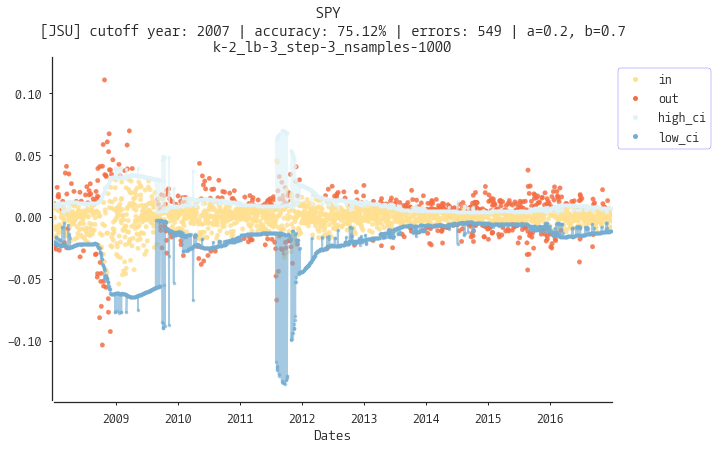

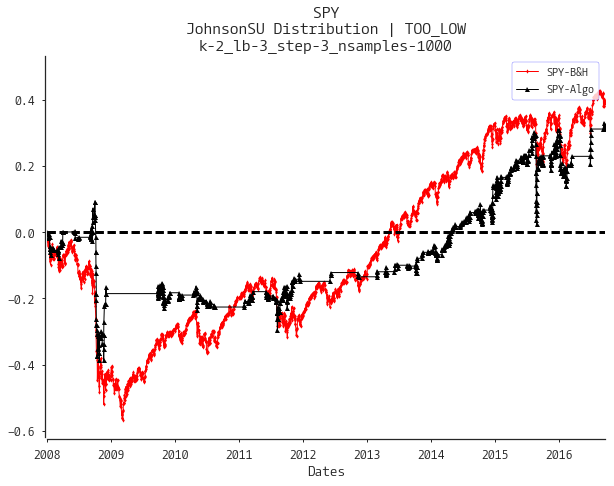

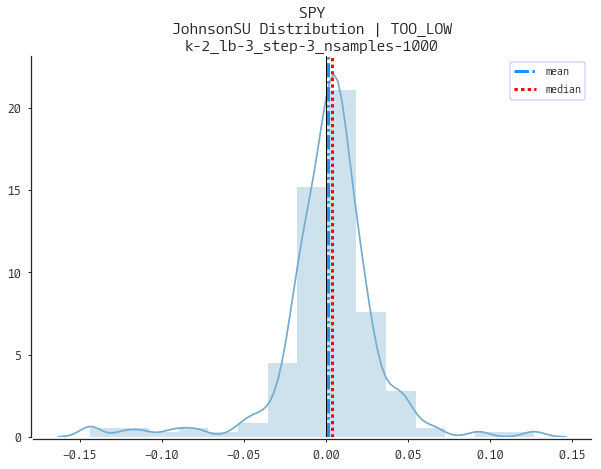

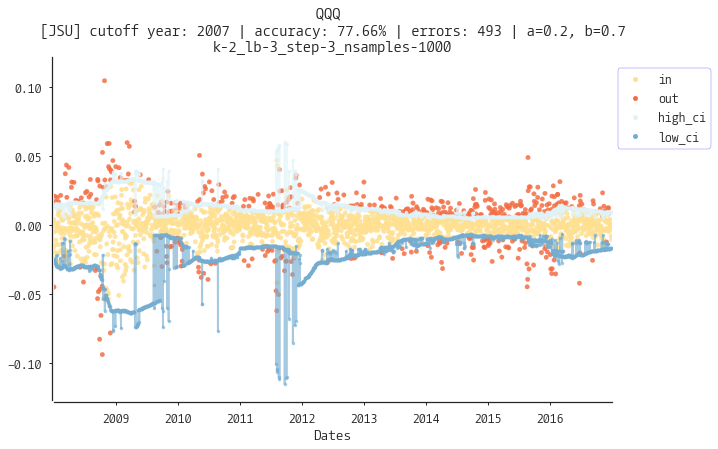

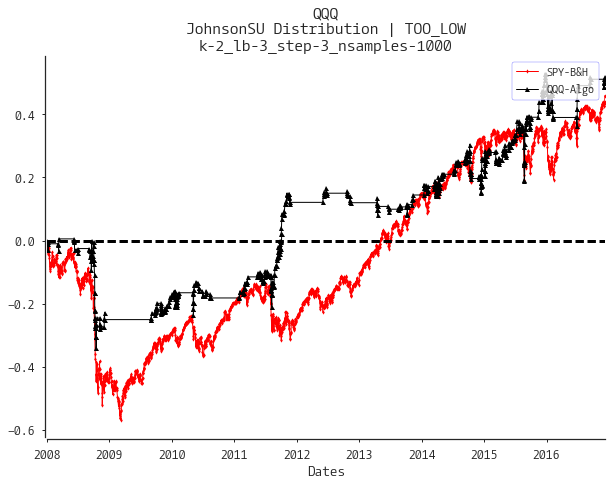

...

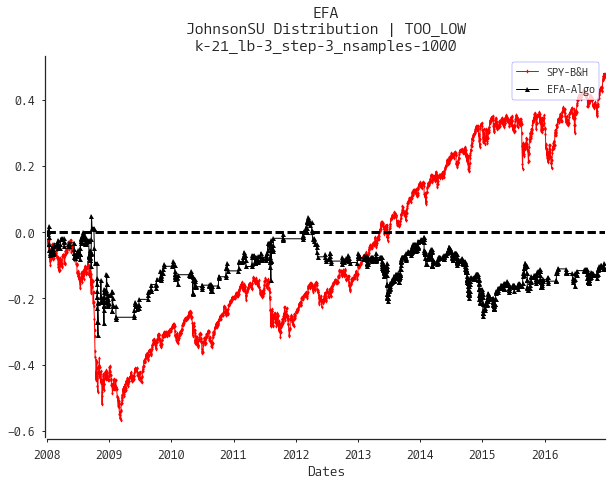

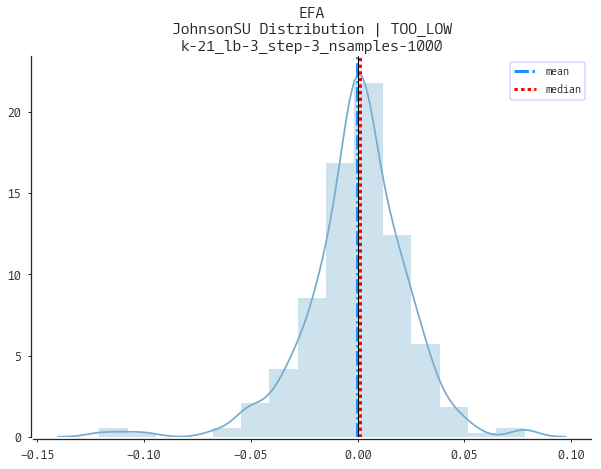

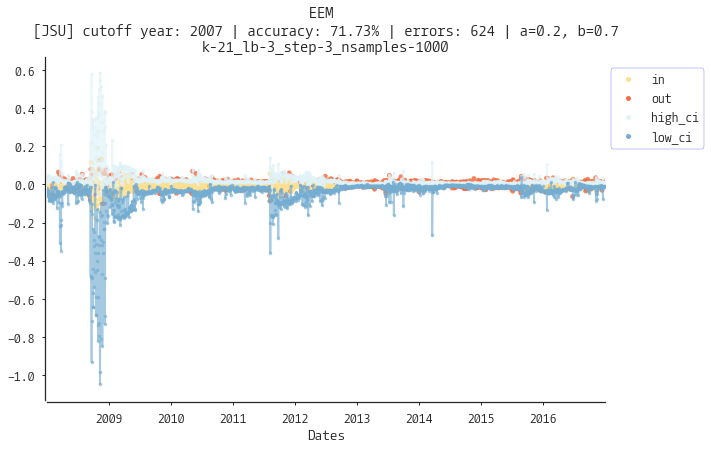

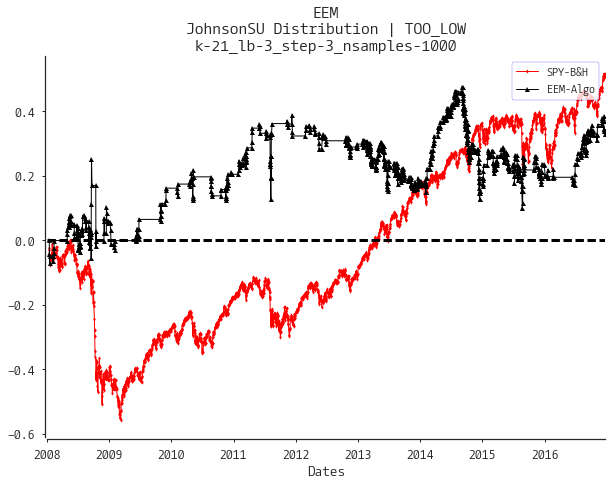

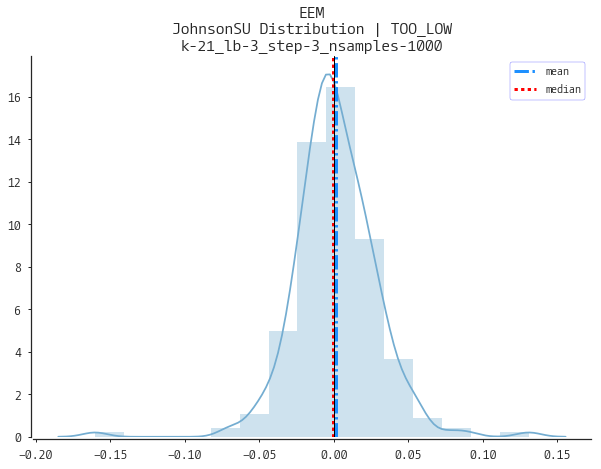

In [102]:
%%time

## AGGREGATE PREDICTIONS FIRST; THEN RUN EVALS AND PLOTS AFTER DON'T COMBINE THE LOOP

#DIR2 = '/home/cam/Documents/Brian_/HDD_folders/_Code/Mixture_Models/BottomPicking/' #stocks_lookback1step1k16/'

smmrys = []
smmrys_k = []

dcts = []
dcts_k = []

postev = []
postev_k = []

evs = []
evs_k = []

agg_dfs = []
agg_dfs_k = []
# Model Params
# ------------
a, b = (.2, .7) # found via coarse parameter search
alpha = 0.99
max_iter = 50
#k = 3 # n_components
init = 'random' # or 'kmeans'
nSamples = 1_000
#bins = 100
year = 2007 # cutoff
lookback = 3 # years
step_fwd = 3 # days
ks = [2,3,5,7,9,13,17,21]
for k in ks:
    if isinstance(k, int):
        file_fmt = _create_dir(DIR, k, lookback, step_fwd, nSamples, year)
        for mkt in chosen_etfs:
            if pd.notnull(mkt):
                p('fitting:', mkt)
                ft_cols = [mkt + '_lret'] + factors

                MR_kwds = dict(ft_cols=ft_cols, k=k, init=init, max_iter=max_iter)
                # NOTE this still walks forward by day how?
                #tmp_data = data.copy().resample('1W').mean()
                MR = ModelRunner(data, **MR_kwds)
                dct = MR.prediction_cycle(year, alpha, a, b, nSamples)
                dcts.append((mkt, dct))
                dcts_k.append((k, mkt, dct))

                res = ResultEval(mkt, dct, step_fwd=step_fwd)
                event_dict = res._get_event_states()
                event = list(event_dict.keys())[1] # [1] = TOO_LOW

                post_events = res.get_post_events(event_dict[event])
                end_vals = res.get_end_vals(post_events)
                smry = res.create_summary(end_vals)

                postev.append((mkt, post_events))
                postev_k.append((mkt, post_events))
                evs.append((mkt, end_vals))
                evs_k.append((k, mkt, end_vals))
                smmrys.append((mkt, smry))
                smmrys_k.append((k, mkt, smry))

                p()
                p('*'*25)
                p(mkt, event.upper())
                p(smry.T)  

                mp = ModelPlots(mkt, post_events, event, DIR, file_fmt, year)
                agg_tmp_df = mp._agg_temp_event_returns()
                agg_dfs.append((mkt, agg_tmp_df))
                agg_dfs_k.append((k, mkt, agg_tmp_df))

                mp.plot_pred_results(dct['pred'], dct['year'], dct['a'], dct['b'])
                mp.plot_equity_curve(benchmark=data['SPY_lret'])
                mp.plot_distplot(end_vals, smry)

In [103]:
pkl_loc = '/home/cam/Documents/Brian_/HDD_folders/_Code/Mixture_Models/BottomPicking/chosen_etf_agg_ks_trim/'
f_suffix = f'k-multiple_lb-{lookback}_step-{step_fwd}_nsamples-{nSamples}.txt'
f_suffix

'k-multiple_lb-3_step-3_nsamples-1000.txt'

In [104]:
smmry_k_f = pkl_loc + 'smmrys_' + f_suffix
smmry_k_f

'/home/cam/Documents/Brian_/HDD_folders/_Code/Mixture_Models/BottomPicking/chosen_etf_agg_ks_trim/smmrys_k-multiple_lb-3_step-3_nsamples-1000.txt'

In [105]:
with open(smmry_k_f, 'wb') as f:
    pickle.dump(smmrys_k, f)   

In [106]:
dcts_k_f = pkl_loc + 'dcts_' + f_suffix
dcts_k_f

'/home/cam/Documents/Brian_/HDD_folders/_Code/Mixture_Models/BottomPicking/chosen_etf_agg_ks_trim/dcts_k-multiple_lb-3_step-3_nsamples-1000.txt'

In [107]:
with open(dcts_k_f, 'wb') as f:
    pickle.dump(dcts_k, f)   

In [108]:
postev_k_f = pkl_loc + 'postevs_' + f_suffix

In [109]:
with open(postev_k_f, 'wb') as f:    
    pickle.dump(postev_k, f)

In [110]:
evs_k_f = pkl_loc + 'evs_' + f_suffix

In [111]:
with open(evs_k_f, 'wb') as f:    
    pickle.dump(evs_k, f)

In [112]:
agg_dfs_k_f = pkl_loc + 'aggs_dfs_' + f_suffix

In [113]:
with open(agg_dfs_k_f, 'wb') as f:
    pickle.dump(agg_dfs_k, f)

In [185]:
#with open(DIR + 'lookback1step5k16/lb1_s5_k16_agg_dfs.txt', 'rb') as f:
#    adt = pickle.load(f)

In [31]:
with open(agg_dfs_k_f, 'rb') as f:
    adk = pickle.load(f)

In [163]:
def plot_pred_results(self, df, year, a, b):
    """Function to plot prediction results and confidence intervals"""
    # colorblind safe palette http://colorbrewer2.org/
    colors = sns.color_palette('RdYlBu', 4)      

    fig, ax = plt.subplots(figsize=(10, 7))   
    ax.scatter(df.index, df.tgt, c=[colors[1] if x==1 else colors[0] for x in df['in_rng']], alpha=0.85, s=20)
    df['high_ci'].plot(ax=ax, alpha=0.65, marker='.', color=colors[2])
    df['low_ci'].plot(ax=ax, alpha=0.65, marker='.', color=colors[3])
    ax.set_xlim(df.index[0], df.index[-1])

    nRight = df.query('in_rng==1').shape[0]
    accuracy = nRight / df.shape[0]    
    ax.set_title('{:^10}\ncutoff year: {} | accuracy: {:2.3%} | errors: {} | a={}, b={}'
                  .format(self.mkt, year, accuracy, df.shape[0] - nRight, a, b))

    in_ = mpl.lines.Line2D(range(1), range(1), color="white", marker='o', markersize=5, markerfacecolor=colors[1])
    out_ = mpl.lines.Line2D(range(1), range(1), color="white", marker='o', markersize=5, markerfacecolor=colors[0])
    hi_ci = mpl.lines.Line2D(range(1), range(1), color="white", marker='.', markersize=10, markerfacecolor=colors[2])
    lo_ci = mpl.lines.Line2D(range(1), range(1), color="white", marker='.', markersize=10, markerfacecolor=colors[3])
    leg = ax.legend([in_, out_, hi_ci, lo_ci],["in", "out", 'high_ci', 'low_ci'],
                    loc = "center left", bbox_to_anchor = (1, 0.85), numpoints = 1)    
    sns.despine(offset=2)
    file_str = self.DIR+f'[JSU] {self.mkt} prediction success {pd.datetime.today()}.png'
    fig.savefig(file_str, dpi=300, bbox_inches="tight")
    return

            ith_state   ith_ret   ith_var    low_ci   high_ci       tgt  \
Dates                                                                     
2008-01-06          1  0.000464  0.000020 -0.001984  0.001835 -0.010379   
2008-01-13          0 -0.001474  0.000031 -0.008332  0.002354 -0.001649   
2008-01-20          1 -0.000811  0.000023 -0.003520  0.000692 -0.011891   
2008-01-27          0 -0.000635  0.000028 -0.003942  0.001193  0.001848   
2008-02-03          0 -0.000532  0.000027 -0.005491  0.002233  0.009598   

            in_rng  
Dates               
2008-01-06       0  
2008-01-13       1  
2008-01-20       0  
2008-01-27       0  
2008-02-03       0  


In [144]:
end_vals = []
d2 = copy.deepcopy(post_events)
for k in d2.keys():
    try:
        tmp = d2[k].copy()
        #p(tmp)
        tmp.iloc[0] = 0 # set initial return to zero
    except Exception as e:
        p()
        p('Error:', e)
        p(' k index:', k)
        

    end_vals.append(tmp.sum())



k index: 202
'numpy.float64' object has no attribute 'iloc'


In [148]:
res1 = ResultEval(mkt, dct, step_fwd=step_fwd)
event_dict1 = res1._get_event_states()
event = list(event_dict1.keys())[1] #[1] # TOO_LOW

post_events1 = res.get_post_events(event_dict1[event])

In [149]:
end_vals1 = res1.get_end_vals(post_events1)
smry1 = res1.create_summary(end_vals1)


SPY Error: 'numpy.float64' object has no attribute 'iloc'
 at k index:  202


In [150]:
smry1.T

,value
mean,0.0009
median,0.0032
max_,0.0503
min_,-0.0965
gt0_cnt,119
lt0_cnt,83
sum_gt0,1.7136
sum_lt0,-1.5413
sum_ratio,1.1117
gt_pct,0.5891


In [194]:
evs[0]

sums = {}
for ev in evs:
    sym, symev = ev
    sums[sym] = sum(symev)

sum(list(sums.values()))

2.369535032254437

In [8]:
#ret_col = [x for x in data.columns if '_lret' in x]
etfs = ['SPY', 'QQQ', 'TLT', 'GLD', 'EFA', 'EEM', 'DBC']
ret_col = [x for x in etfs if x+'_lret' in data.columns]
test_cols = ret_col + factors
corr = data[test_cols].corr()

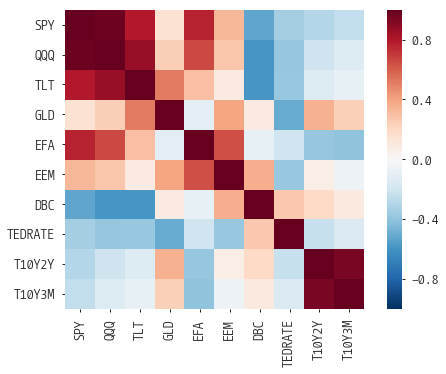

In [9]:
sns.heatmap(corr, square=True)

In [126]:
evs[0]

sums = {}
for ev in evs:
    sym, symev = ev
    sums[sym] = sum(symev)

sum(list(sums.values()))

-2.051158500444514

In [ ]:
cutoff = year
train_df = tmp_data.ix[str(cutoff - lookback):str(cutoff)].dropna()
oos = tmp_data.ix[str(cutoff+1):].dropna()
# confirm that train_df end index is different than oos start index
assert train_df.index[-1] != oos.index[0]
oos.head()

i=0
for t in tqdm(oos.index):
    if i == 2:
        break
    p(tmp_data.ix[:t].tail())
    i+=1


In [ ]:


too_high_dates = df.query("tgt > high_ci")['Dates']
too_low_dates = df.query("tgt < low_ci")['Dates']

In [ ]:
dir(too_high_dates.diff().iloc[1])

In [ ]:
t = too_high_dates.diff()

cnt = 0
for dt in t:
    try:
        if dt.days < step_fwd:
            cnt += 1
    except: continue
print(cnt)        

In [ ]:
cnt / t.shape[0]



In [ ]:
for name, hex in mpl.colors.cnames.items():
    print(name, hex)

In [ ]:
# code sample from:
#   http://www.aizac.info/simple-check-of-a-sample-against-80-distributions/

cdfs = [
    "norm",            #Normal (Gaussian)
    "alpha",           #Alpha
    "anglit",          #Anglit
    "arcsine",         #Arcsine
    "beta",            #Beta
    "betaprime",       #Beta Prime
    "bradford",        #Bradford
    "burr",            #Burr
    "cauchy",          #Cauchy
    "chi",             #Chi
    "chi2",            #Chi-squared
    "cosine",          #Cosine
    "dgamma",          #Double Gamma
    "dweibull",        #Double Weibull
    "erlang",          #Erlang
    "expon",           #Exponential
    "exponweib",       #Exponentiated Weibull
    "exponpow",        #Exponential Power
    "fatiguelife",     #Fatigue Life (Birnbaum-Sanders)
    "foldcauchy",      #Folded Cauchy
    "f",               #F (Snecdor F)
    "fisk",            #Fisk
    "foldnorm",        #Folded Normal
    "frechet_r",       #Frechet Right Sided, Extreme Value Type II
    "frechet_l",       #Frechet Left Sided, Weibull_max
    "gamma",           #Gamma
    "gausshyper",      #Gauss Hypergeometric
    "genexpon",        #Generalized Exponential
    "genextreme",      #Generalized Extreme Value
    "gengamma",        #Generalized gamma
    "genlogistic",     #Generalized Logistic
    "genpareto",       #Generalized Pareto
    "genhalflogistic", #Generalized Half Logistic
    "gilbrat",         #Gilbrat
    "gompertz",        #Gompertz (Truncated Gumbel)
    "gumbel_l",        #Left Sided Gumbel, etc.
    "gumbel_r",        #Right Sided Gumbel
    "halfcauchy",      #Half Cauchy
    "halflogistic",    #Half Logistic
    "halfnorm",        #Half Normal
    "hypsecant",       #Hyperbolic Secant
    "invgamma",        #Inverse Gamma
    "invnorm",         #Inverse Normal
    "invweibull",      #Inverse Weibull
    "johnsonsb",       #Johnson SB
    "johnsonsu",       #Johnson SU
    "laplace",         #Laplace
    "logistic",        #Logistic
    "loggamma",        #Log-Gamma
    "loglaplace",      #Log-Laplace (Log Double Exponential)
    "lognorm",         #Log-Normal
    "lomax",           #Lomax (Pareto of the second kind)
    "maxwell",         #Maxwell
    "mielke",          #Mielke's Beta-Kappa
    "nakagami",        #Nakagami
    "ncx2",            #Non-central chi-squared
#    "ncf",             #Non-central F
    "nct",             #Non-central Student's T
    "norm"           # Normal
    "pareto",          #Pareto
    "powerlaw",        #Power-function
    "powerlognorm",    #Power log normal
    "powernorm",       #Power normal
    "rdist",           #R distribution
    "reciprocal",      #Reciprocal
    "rayleigh",        #Rayleigh
    "rice",            #Rice
    "recipinvgauss",   #Reciprocal Inverse Gaussian
    "semicircular",    #Semicircular
    "t",               #Student's T
    "triang",          #Triangular
    "truncexpon",      #Truncated Exponential
    "truncnorm",       #Truncated Normal
    "tukeylambda",     #Tukey-Lambda
    "uniform",         #Uniform
    "vonmises",        #Von-Mises (Circular)
    "wald",            #Wald
    "weibull_min",     #Minimum Weibull (see Frechet)
    "weibull_max",     #Maximum Weibull (see Frechet)
    "wrapcauchy",      #Wrapped Cauchy
    "ksone",           #Kolmogorov-Smirnov one-sided (no stats)
    "kstwobign"]       #Kolmogorov-Smirnov two-sided test for Large N

sample = data['lret'].values
for cdf in cdfs:
    try:
        #fit our data set against every probability distribution
        parameters = eval("scs."+cdf+".fit(sample)");

        #Applying the Kolmogorov-Smirnof one sided test
        D, p = scs.kstest(sample, cdf, args=parameters);

        #pretty-print the results
        D = round(D, 5)
        p = round(p, 5)
        
        #pretty-print the results
        print (cdf.ljust(16) + ("p: "+str(p)).ljust(25)+"D: "+str(D));
    except: continue
    

In [ ]:
cdf = 'cdf'
p = 0.00434234
D = 23.54023444


print ("{:{align}} p:{:{width}.{prec}f}".format(cdf, p, width=16, align='<', prec=5))# p: {p:.5f} D: {D:.5f}"